In [12]:
import numpy as np
import seaborn
import glob
import librosa
import librosa.display
from keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import os
from keras.preprocessing.image import ImageDataGenerator
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from keras.layers import Dense, Input, Dropout, GlobalAveragePooling2D, Flatten, Conv2D, BatchNormalization, Activation, MaxPooling2D
from keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint

from sklearn.metrics import confusion_matrix
import itertools

from keras.models import model_from_json

from pathlib import Path

import soundfile as sf
from scipy import signal
from scipy.io import wavfile

In [24]:
#Run this code from whatever folder
#you want the data to be in.
#English
from __future__ import unicode_literals
import yt_dlp


ydl_opts = {
    'format': 'bestaudio/best',
    'postprocessors': [{
        'key': 'FFmpegExtractAudio',
        'preferredcodec': 'wav',
        'preferredquality': '192',
    }],
    'outtmpl': "/media/russell/ESD-USB/English"+ '/%(title)s.%(ext)s',
}
with yt_dlp.YoutubeDL(ydl_opts) as ydl:
    ydl.download(['https://www.youtube.com/playlist?list=PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n'])
    #ydl.download(['https://www.youtube.com/watch?v=La4Dcd1aUcE'])
    #ydl.download(['https://www.youtube.com/watch?v=Kvgz6swo-vY'])
    #ydl.download(['https://www.youtube.com/watch?v=FTQbiNvZqaY'])
 #   ydl.download(['https://www.youtube.com/watch?v=Q86nf7mpOXk)'])
#     ydl.download(['https://www.youtube.com/watch?v=LHCob76kigA'])
#     ydl.download(['https://www.youtube.com/watch?v=djV11Xbc914'])
#     ydl.download(['https://www.youtube.com/watch?v=DC8FsIdVi9Y'])
#     ydl.download(['https://www.youtube.com/watch?v=Vnoz5uBEWOA'])
#     ydl.download(['https://www.youtube.com/watch?v=n4RjJKxsamQ'])
#     ydl.download(['https://www.youtube.com/watch?v=FjRPDzcmJT4'])
#     ydl.download(['https://www.youtube.com/watch?v=kn6-c223DUU'])
#     ydl.download(['https://www.youtube.com/watch?v=6I2y_UbVz4U'])
#     ydl.download(['https://www.youtube.com/watch?v=9vMh9f41pqE'])
#     ydl.download(['https://www.youtube.com/watch?v=5anLPw0Efmo'])
#     ydl.download(['https://www.youtube.com/watch?v=1TsVjvEkc4s'])
#     ydl.download(['https://www.youtube.com/watch?v=vNoKguSdy4Y'])
#     ydl.download(['https://www.youtube.com/watch?v=XjwZAa2EjKA'])
#     ydl.download(['https://www.youtube.com/watch?v=Y7ix6RITXM0'])
#     ydl.download(['https://www.youtube.com/watch?v=D7K3wFXJFsQ'])
#     ydl.download(['https://www.youtube.com/watch?v=fk4BbF7B29w'])
#     ydl.download(['https://www.youtube.com/watch?v=zRIbf6JqkNc'])
#     ydl.download(['https://www.youtube.com/watch?v=VBmMU_iwe6U'])
#     ydl.download(['https://www.youtube.com/watch?v=ZyhrYis509A'])
#     ydl.download(['https://www.youtube.com/watch?v=PIb6AZdTr-A'])
#     ydl.download(['https://www.youtube.com/watch?v=36mCEZzzQ3o'])
#     ydl.download(['https://www.youtube.com/watch?v=DzwkcbTQ7ZE'])
#     ydl.download(['https://www.youtube.com/watch?v=KrVC5dm5fFc'])
#     ydl.download(['https://www.youtube.com/watch?v=bg1sT4ILG0w'])
#     ydl.download(['https://www.youtube.com/watch?v=weRHyjj34ZE'])
#     ydl.download(['https://www.youtube.com/watch?v=fJ9rUzIMcZQ'])
#     ydl.download(['https://www.youtube.com/watch?v=yd8jh9QYfEs'])
#     ydl.download(['https://www.youtube.com/watch?v=iP6XpLQM2Cs'])
#     ydl.download(['https://www.youtube.com/watch?v=9WbCfHutDSE'])
#     ydl.download(['https://www.youtube.com/watch?v=3YxaaGgTQYM'])
#     ydl.download(['https://www.youtube.com/watch?v=TR3Vdo5etCQ'])
#     ydl.download(['https://www.youtube.com/watch?v=qDRORgoZxZU'])
#     ydl.download(['https://www.youtube.com/watch?v=gdx7gN1UyX0'])
#     ydl.download(['https://www.youtube.com/watch?v=YnwsMEabmSo'])
#     ydl.download(['https://www.youtube.com/watch?v=rClUOdS5Zyw'])
#     ydl.download(['https://www.youtube.com/watch?v=nPvuNsRccVw'])
#     ydl.download(['https://www.youtube.com/watch?v=cmSbXsFE3l8'])
#     ydl.download(['https://www.youtube.com/watch?v=HHP5MKgK0o8'])
#     ydl.download(['https://www.youtube.com/watch?v=-2U0Ivkn2Ds'])
#     ydl.download(['https://www.youtube.com/watch?v=8WYHDfJDPDc'])
#     ydl.download(['https://www.youtube.com/watch?v=Wa5B22KAkEk'])
#     ydl.download(['https://www.youtube.com/watch?v=ShlW5plD_40'])
#     ydl.download(['https://www.youtube.com/watch?v=vxc1ufJxPGM'])
#     ydl.download(['https://www.youtube.com/watch?v=SAXpBgkXt60'])
#     ydl.download(['https://www.youtube.com/watch?v=Ri7-vnrJD3k'])
#     ydl.download(['https://www.youtube.com/watch?v=9BMwcO6_hyA'])
#     ydl.download(['https://www.youtube.com/watch?v=aCeHAVMbVqM'])
#     ydl.download(['https://www.youtube.com/watch?v=RubBzkZzpUA'])
#     ydl.download(['https://www.youtube.com/watch?v=YlUKcNNmywk'])
#     ydl.download(['https://www.youtube.com/watch?v=EkHTsc9PU2A'])
#     ydl.download(['https://www.youtube.com/watch?v=lgT1AidzRWM'])
#     ydl.download(['https://www.youtube.com/watch?v=Ho32Oh6b4jc'])
#     ydl.download(['https://www.youtube.com/watch?v=SRcnnId15BA'])
#     ydl.download(['https://www.youtube.com/watch?v=O6xyD4CY_Sg'])
#     ydl.download(['https://www.youtube.com/watch?v=Q_mQxKviRJM'])
#     ydl.download(['https://www.youtube.com/watch?v=GTyN-DB_v5M'])
#     ydl.download(['https://www.youtube.com/watch?v=nSDgHBxUbVQ'])
#     ydl.download(['https://www.youtube.com/watch?v=Bag1gUxuU0g'])
#     ydl.download(['https://www.youtube.com/watch?v=47dtFZ8CFo8'])
#     ydl.download(['https://www.youtube.com/watch?v=lDK9QqIzhwk'])
#     ydl.download(['https://www.youtube.com/watch?v=CvBfHwUxHIk'])
#     ydl.download(['https://www.youtube.com/watch?v=xwtdhWltSIg'])
#     ydl.download(['https://www.youtube.com/watch?v=vJwKKKd2ZYE'])
#     ydl.download(['https://www.youtube.com/watch?v=QNJL6nfu__Q'])
#     ydl.download(['https://www.youtube.com/watch?v=ZaI2IlHwmgQ'])
#     ydl.download(['https://www.youtube.com/watch?v=vbPC_81gGs4'])
#     ydl.download(['https://www.youtube.com/watch?v=_kqQDCxRCzM'])
#     ydl.download(['https://www.youtube.com/watch?v=bvC_0foemLY'])
#     ydl.download(['https://www.youtube.com/watch?v=b-J95fYuVz4'])
#     ydl.download(['https://www.youtube.com/watch?v=WLTI2rWAlV4'])
#     ydl.download(['https://www.youtube.com/watch?v=RgKAFK5djSk'])
#     ydl.download(['https://www.youtube.com/watch?v=fRh_vgS2dFE'])
#     ydl.download(['https://www.youtube.com/watch?v=OPf0YbXqDm0'])
#     ydl.download(['https://www.youtube.com/watch?v=e-ORhEE9VVg'])
#     ydl.download(['https://www.youtube.com/watch?v=nfWlot6h_JM'])
#     ydl.download(['https://www.youtube.com/watch?v=YqeW9_5kURI'])
#     ydl.download(['https://www.youtube.com/watch?v=YQHsXMglC9A'])
#     ydl.download(['https://www.youtube.com/watch?v=CevxZvSJLk8'])
#     ydl.download(['https://www.youtube.com/watch?v=09R8_2nJtjg'])
#     ydl.download(['https://www.youtube.com/watch?v=7PCkvCPvDXk'])
#     ydl.download(['https://www.youtube.com/watch?v=2vjPBrBU-TM'])
#     ydl.download(['https://www.youtube.com/watch?v=DK_0jXPuIr0'])
#     ydl.download(['https://www.youtube.com/watch?v=lp-EO5I60KA'])
#     ydl.download(['https://www.youtube.com/watch?v=5GL9JoH4Sws'])
#     ydl.download(['https://www.youtube.com/watch?v=AJtDXIazrMo'])
#     ydl.download(['https://www.youtube.com/watch?v=kOkQ4T5WO9E'])
#     ydl.download(['https://www.youtube.com/watch?v=RBumgq5yVrA'])
#     ydl.download(['https://www.youtube.com/watch?v=pRpeEdMmmQ0'])
#     ydl.download(['https://www.youtube.com/watch?v=YBHQbu5rbdQ'])
#     ydl.download(['https://www.youtube.com/watch?v=uelHwf8o7_U'])
#     ydl.download(['https://www.youtube.com/watch?v=PT2_F-1esPk'])
#     ydl.download(['https://www.youtube.com/watch?v=KQ6zr6kCPj8'])
#     ydl.download(['https://www.youtube.com/watch?v=IcrbM1l_BoI'])
#     ydl.download(['https://www.youtube.com/watch?v=vjW8wmF5VWc)'])
#     ydl.download(['https://www.youtube.com/watch?v=PIh2xe4jnpk'])
#     ydl.download(['https://www.youtube.com/watch?v=uxpDa-c-4Mc'])
#     ydl.download(['https://www.youtube.com/watch?v=oyEuk8j8imI'])
#     ydl.download(['https://www.youtube.com/watch?v=xscJ8Lla6Gc'])
#     ydl.download(['https://www.youtube.com/watch?v=rYEDA3JcQqw'])

[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n: Downloading webpage
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n: Downloading API JSON with unavailable videos
[download] Downloading playlist: Most Viewed English Songs on Youtube (Playlist)
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 1: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 2: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 3: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 4: Downloading API JSON


[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 5: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 6: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 7: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 8: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 9: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 10: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 11: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 12: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 13: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 14: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 15: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 16: Downloading API JSON
[youtube:tab] PLhsz9CILh357zA1yMT-K5T9ZTNEU6Fl6n page 17:

ERROR: unable to create directory [Errno 13] Permission denied: '/media/russell'


DownloadError: ERROR: unable to create directory [Errno 13] Permission denied: '/media/russell'

In [16]:
#Run this code from whatever folder
#you want the data to be in.
#French
from __future__ import unicode_literals
import yt_dlp


ydl_opts = {
    'format': 'bestaudio/best',
    'postprocessors': [{
        'key': 'FFmpegExtractAudio',
        'preferredcodec': 'wav',
        'preferredquality': '192',
    }],
}
with yt_dlp.YoutubeDL(ydl_opts) as ydl:
    ydl.download(['https://www.youtube.com/watch?v=sQnlR2effdQ'])
    ydl.download(['https://www.youtube.com/watch?v=oiKj0Z_Xnjc'])
    ydl.download(['https://www.youtube.com/watch?v=mF5etHMRMMM'])
    ydl.download(['https://www.youtube.com/watch?v=8Si2q_rxvWA'])
    ydl.download(['https://www.youtube.com/watch?v=wjud3Ue-pFE'])
    ydl.download(['https://www.youtube.com/watch?v=K5KAc5CoCuk'])
    ydl.download(['https://www.youtube.com/watch?v=FomT_qar0GE'])
    ydl.download(['https://www.youtube.com/watch?v=Y7-vP7TnluY'])
    ydl.download(['https://www.youtube.com/watch?v=BvIvwHoG5fs'])
    ydl.download(['https://www.youtube.com/watch?v=NiHWwKC8WjU'])
    ydl.download(['https://www.youtube.com/watch?v=VHoT4N43jK8'])
    ydl.download(['https://www.youtube.com/watch?v=cwaAppsy5yo'])
    ydl.download(['https://www.youtube.com/watch?v=NwVA5zYfNWw'])
    ydl.download(['https://www.youtube.com/watch?v=cmE_aahc448'])
    ydl.download(['https://www.youtube.com/watch?v=4J39Ol6T0Xw'])
    ydl.download(['https://www.youtube.com/watch?v=U-Z_bZS8t3M'])
    ydl.download(['https://www.youtube.com/watch?v=i0p5aZBvAoo'])
    ydl.download(['https://www.youtube.com/watch?v=bPxwu5OZ-HM'])
    ydl.download(['https://www.youtube.com/watch?v=63K5VMx2BZM'])
    ydl.download(['https://www.youtube.com/watch?v=f6GHAbenqvM'])
    ydl.download(['https://www.youtube.com/watch?v=lcSakE8U6lk'])
#     ydl.download(['https://www.youtube.com/watch?v=mOuzyjsGYXc'])
    ydl.download(['https://www.youtube.com/watch?v=519_pOvP9xs'])
    ydl.download(['https://www.youtube.com/watch?v=vCRThAYKXEc'])
    ydl.download(['https://www.youtube.com/watch?v=7l2o1tgFZGk'])
    ydl.download(['https://www.youtube.com/watch?v=H7rhMqTQ4WI'])
    ydl.download(['https://www.youtube.com/watch?v=VcViDBhgJrM'])
#     ydl.download(['https://www.youtube.com/watch?v=hoPIDJy93Nc'])
    ydl.download(['https://www.youtube.com/watch?v=uDyHQGHic0I'])
    ydl.download(['https://www.youtube.com/watch?v=13o1i-cgTOA'])
    ydl.download(['https://www.youtube.com/watch?v=O8Lv32YyAgU'])
    ydl.download(['https://www.youtube.com/watch?v=O8MClBoNlfE'])
    ydl.download(['https://www.youtube.com/watch?v=egwvEm3nbmc'])
    ydl.download(['https://www.youtube.com/watch?v=EC7Re8cczj0'])
#     ydl.download(['https://www.youtube.com/watch?v=jyBN6lbhUFM'])
    ydl.download(['https://www.youtube.com/watch?v=aS1SGkWoHec'])
    ydl.download(['https://www.youtube.com/watch?v=2zdqymnZoHc'])
    ydl.download(['https://www.youtube.com/watch?v=hmF_AasWf2g'])
    ydl.download(['https://www.youtube.com/watch?v=AW5zbbXbaN4'])
    ydl.download(['https://www.youtube.com/watch?v=tPXHhB8woyc'])
    ydl.download(['https://www.youtube.com/watch?v=tB-zasOL29Y'])
    ydl.download(['https://www.youtube.com/watch?v=zSpLOlxy9nI'])
    ydl.download(['https://www.youtube.com/watch?v=i3u0vq0WyIA'])
    ydl.download(['https://www.youtube.com/watch?v=uduL7z8BkOs'])
    ydl.download(['https://www.youtube.com/watch?v=TL-q_xCggTE'])
#     ydl.download(['https://www.youtube.com/watch?v=V82wcQbfZmc'])
    ydl.download(['https://www.youtube.com/watch?v=pv-49f38H9M'])
    ydl.download(['https://www.youtube.com/watch?v=AfkiMp7piiY'])
    ydl.download(['https://www.youtube.com/watch?v=2wicVDVQzzM'])
    ydl.download(['https://www.youtube.com/watch?v=KAOmC5qT02w'])
#     ydl.download(['https://www.youtube.com/watch?v=21NYo61E3M4'])
    ydl.download(['https://www.youtube.com/watch?v=2uktfm6uGAE'])
    ydl.download(['https://www.youtube.com/watch?v=N6dAfbR5kK4'])
    ydl.download(['https://www.youtube.com/watch?v=LuAQHcYDuYY'])
    ydl.download(['https://www.youtube.com/watch?v=p9_B9UABex0'])
    ydl.download(['https://www.youtube.com/watch?v=7Vv5sDQ9aFU'])
    ydl.download(['https://www.youtube.com/watch?v=6XHwKRnDZmk'])
    ydl.download(['https://www.youtube.com/watch?v=lgUHb-_t2_U'])
    ydl.download(['https://www.youtube.com/watch?v=PHWzFM_Hxvo'])
    ydl.download(['https://www.youtube.com/watch?v=0EGrlRA9Ut8'])
    ydl.download(['https://www.youtube.com/watch?v=DDJoTizuUpM'])
    ydl.download(['https://www.youtube.com/watch?v=3Hr_gmFWfA4'])
    ydl.download(['https://www.youtube.com/watch?v=_0S3idlfO40'])
    ydl.download(['https://www.youtube.com/watch?v=Y99UqvgCmE8'])
    ydl.download(['https://www.youtube.com/watch?v=XzoirUEntug'])
    ydl.download(['https://www.youtube.com/watch?v=k77AMWp8t64'])
    ydl.download(['https://www.youtube.com/watch?v=YUIHo_V85Xc'])
    ydl.download(['https://www.youtube.com/watch?v=LZPT5_k5Al4'])
    ydl.download(['https://www.youtube.com/watch?v=ybW7B3IFRh4'])
    ydl.download(['https://www.youtube.com/watch?v=FsJWSDe44Uk'])
    ydl.download(['https://www.youtube.com/watch?v=1mvz7I7Dp5c'])
    ydl.download(['https://www.youtube.com/watch?v=1aPAcGKuZfA'])
    ydl.download(['https://www.youtube.com/watch?v=AS4GlgkW5Fc'])
    ydl.download(['https://www.youtube.com/watch?v=YAS8-_w9wQQ'])
    ydl.download(['https://www.youtube.com/watch?v=qhYtVMoWFNQ'])
    ydl.download(['https://www.youtube.com/watch?v=1VTtR1ftPJU'])
#     ydl.download(['https://www.youtube.com/watch?v=ODAxvuGsYYY'])
    ydl.download(['https://www.youtube.com/watch?v=XVW5qA7QLmw'])
#     ydl.download(['https://www.youtube.com/watch?v=EbrrSSvrSZ8'])
#     ydl.download(['https://www.youtube.com/watch?v=pQtisw9837A'])
    ydl.download(['https://www.youtube.com/watch?v=2Zp3agWZmOg'])
    ydl.download(['https://www.youtube.com/watch?v=Pw3D0cVQiek'])
    ydl.download(['https://www.youtube.com/watch?v=Y4uOM7s38XA'])
    ydl.download(['https://www.youtube.com/watch?v=P5jVK5kD0y0'])
    ydl.download(['https://www.youtube.com/watch?v=N9oCFfRXEF4'])
    ydl.download(['https://www.youtube.com/watch?v=wtK6JClJXvg'])
    ydl.download(['https://www.youtube.com/watch?v=dE7oGkrIjvs'])
#     ydl.download(['https://www.youtube.com/watch?v=GME3fMeK5ts'])
    ydl.download(['https://www.youtube.com/watch?v=W7RTg-dViKg'])
    ydl.download(['https://www.youtube.com/watch?v=M7X6oYg6iro'])
    ydl.download(['https://www.youtube.com/watch?v=2bAMyiaIwNk'])
#     ydl.download(['https://www.youtube.com/watch?v=S0nnZEKC42U'])
#     ydl.download(['https://www.youtube.com/watch?v=vLxavctn240'])
    ydl.download(['https://www.youtube.com/watch?v=FAI8zaw4h7o'])
    ydl.download(['https://www.youtube.com/watch?v=pdPwbUk4R34'])
#     ydl.download(['https://www.youtube.com/watch?v=guADTFlEHJE'])
    ydl.download(['https://www.youtube.com/watch?v=OZfJf-8xwKM'])
    ydl.download(['https://www.youtube.com/watch?v=qhzZTcBBhaU'])
#     ydl.download(['https://www.youtube.com/watch?v=hvi2uY2rgns'])
    ydl.download(['https://www.youtube.com/watch?v=Gsz7IuZ3paM'])

ModuleNotFoundError: No module named 'yt_dlp'

In [49]:
#Run this code from whatever folder
#you want the data to be in.
#German
from __future__ import unicode_literals
import yt_dlp

ydl_opts = {
    'format': 'bestaudio/best',
    'postprocessors': [{
        'key': 'FFmpegExtractAudio',
        'preferredcodec': 'wav',
        'preferredquality': '192',
    }],
}
with yt_dlp.YoutubeDL(ydl_opts) as ydl:
      ydl.download(['https://www.youtube.com/playlist?list=PLI-n-55RUT-_Ej39IlAxon_hOJWeET7cI'])
#     ydl.download(['https://www.youtube.com/watch?v=Ahwc-ouFeTQ'])
#     ydl.download(['https://www.youtube.com/watch?v=nyrcAPJSRJc'])
# #     ydl.download(['https://www.youtube.com/watch?v=uT-hBZXTwEI'])
#     ydl.download(['https://www.youtube.com/watch?v=5kmEM2u1dZA'])
#     ydl.download(['https://www.youtube.com/watch?v=82NBsCOQoi4'])
#     ydl.download(['https://www.youtube.com/watch?v=2CGv2Ud-KoE'])
#     ydl.download(['https://www.youtube.com/watch?v=l1FFp_4C--I'])
# #     ydl.download(['https://www.youtube.com/watch?v=O9V1ekvSAhg'])
#     ydl.download(['https://www.youtube.com/watch?v=AMT9IOyXmBM'])
#     ydl.download(['https://www.youtube.com/watch?v=YaKG5cUVB30'])
#     ydl.download(['https://www.youtube.com/watch?v=VeYfi8O0OOQ'])
#     ydl.download(['https://www.youtube.com/watch?v=drFsXLChrWc'])
#     ydl.download(['https://www.youtube.com/watch?v=HbtGDZf9Ts8'])
#     ydl.download(['https://www.youtube.com/watch?v=vGrfFzagzHs'])
#     ydl.download(['https://www.youtube.com/watch?v=EEdyjP34CsY'])
#     ydl.download(['https://www.youtube.com/watch?v=7_tWN9Iei7Y'])
#     ydl.download(['https://www.youtube.com/watch?v=j1z_gb7ngLQ'])
#     ydl.download(['https://www.youtube.com/watch?v=fvkacsZFJE0'])
#     ydl.download(['https://www.youtube.com/watch?v=kiMG_JV2gbo'])
# #     ydl.download(['https://www.youtube.com/watch?v=lQ03Lo-hLmI'])
#     ydl.download(['https://www.youtube.com/watch?v=Cf27Q2bfftQ'])
#     ydl.download(['https://www.youtube.com/watch?v=qYRCiQ6d35w'])
#     ydl.download(['https://www.youtube.com/watch?v=ysAEZOwp5rM'])
#     ydl.download(['https://www.youtube.com/watch?v=5a0xis7mONc'])
#     ydl.download(['https://www.youtube.com/watch?v=RveIJFR7LV4'])
# #     ydl.download(['https://www.youtube.com/watch?v=GSV1PBthpgQ'])
#     ydl.download(['https://www.youtube.com/watch?v=yqObMM_QzVQ'])
#     ydl.download(['https://www.youtube.com/watch?v=fkMg_X9lHMc'])
#     ydl.download(['https://www.youtube.com/watch?v=O3UBOOZw-FE'])
# #     ydl.download(['https://www.youtube.com/watch?v=40ouL7n1sQk'])
#     ydl.download(['https://www.youtube.com/watch?v=1il3RFk5Okw'])
#     ydl.download(['https://www.youtube.com/watch?v=cZ58odQo87A'])
#     ydl.download(['https://www.youtube.com/watch?v=5PST7Ld4wWU'])
#     ydl.download(['https://www.youtube.com/watch?v=MU7jt2-LHAc'])
#     ydl.download(['https://www.youtube.com/watch?v=TxnJoF9qmkA'])
#     ydl.download(['https://www.youtube.com/watch?v=b3cU182bGfQ'])
#     ydl.download(['https://www.youtube.com/watch?v=V9Y-BM-I_x0'])
#     ydl.download(['https://www.youtube.com/watch?v=vmj2Ab1GknA'])
#     ydl.download(['https://www.youtube.com/watch?v=o337Ne80ePU'])
#     ydl.download(['https://www.youtube.com/watch?v=QRs33vbhyvA'])
#     ydl.download(['https://www.youtube.com/watch?v=YGpak_xS47o'])
#     ydl.download(['https://www.youtube.com/watch?v=-uZvLNIQMKQ'])
#     ydl.download(['https://www.youtube.com/watch?v=pLHnnJRaP7Q'])
#     ydl.download(['https://www.youtube.com/watch?v=4tDpYxNYqPg'])
#     ydl.download(['https://www.youtube.com/watch?v=4iXXTgOvBAc'])
#     ydl.download(['https://www.youtube.com/watch?v=gx9KFXb5x_o'])
#     ydl.download(['https://www.youtube.com/watch?v=vAI7PMkt2Bc'])
#     ydl.download(['https://www.youtube.com/watch?v=2Ra5czl1Tgc'])
#     ydl.download(['https://www.youtube.com/watch?v=Vk0wDlG838E'])
#     ydl.download(['https://www.youtube.com/watch?v=8HWUQW49wBk'])
#     ydl.download(['https://www.youtube.com/watch?v=1EMFt7m_8yE'])
#     ydl.download(['https://www.youtube.com/watch?v=RsZvjqG2lec'])
#     ydl.download(['https://www.youtube.com/watch?v=C9HL-2IhZKg'])
#     ydl.download(['https://www.youtube.com/watch?v=kDMFranvFuQ'])
#     ydl.download(['https://www.youtube.com/watch?v=oq0rrYrufYU'])
#     ydl.download(['https://www.youtube.com/watch?v=DraA3PUuoQc'])
#     ydl.download(['https://www.youtube.com/watch?v=FPvVZG9hlVY'])
#     ydl.download(['https://www.youtube.com/watch?v=ZbsqG_R3ySE'])
#     ydl.download(['https://www.youtube.com/watch?v=B6ApzrQXEss'])
#     ydl.download(['https://www.youtube.com/watch?v=NRbD3ggyc7U'])
#     ydl.download(['https://www.youtube.com/watch?v=xFnlPF3KUqo'])
#     ydl.download(['https://www.youtube.com/watch?v=RVTvrzjQAGY'])
#     ydl.download(['https://www.youtube.com/watch?v=RTlzQEA-4oc'])
#     ydl.download(['https://www.youtube.com/watch?v=zOvsyamoEDg'])
#     ydl.download(['https://www.youtube.com/watch?v=ETQ4QxYNM8k'])
#     ydl.download(['https://www.youtube.com/watch?v=DGrPaVZH4mE'])
#     ydl.download(['https://www.youtube.com/watch?v=cbTXqKBIQ40'])
#     ydl.download(['https://www.youtube.com/watch?v=bLKrNq5VMiQ'])
#     ydl.download(['https://www.youtube.com/watch?v=zptCf66xGDg'])
#     ydl.download(['https://www.youtube.com/watch?v=2-lFjhdlsqc'])
#     ydl.download(['https://www.youtube.com/watch?v=hilPSLUFK2Q'])
#     ydl.download(['https://www.youtube.com/watch?v=1Hl0Y00a44M'])
#     ydl.download(['https://www.youtube.com/watch?v=riH-Nd5VbrQ'])
#     ydl.download(['https://www.youtube.com/watch?v=sstcOguIloI'])
#     ydl.download(['https://www.youtube.com/watch?v=kms3CKdcVWM'])
#     ydl.download(['https://www.youtube.com/watch?v=xqFpnTvucTU'])
#     ydl.download(['https://www.youtube.com/watch?v=iA45Om6taqg'])
#     ydl.download(['https://www.youtube.com/watch?v=qdtLCfEcPL4'])
#     ydl.download(['https://www.youtube.com/watch?v=qttGJ3il62Y'])
#     ydl.download(['https://www.youtube.com/watch?v=UJpyFMXtZb4'])
#     ydl.download(['https://www.youtube.com/watch?v=n1aSGRd0hg0'])
#     ydl.download(['https://www.youtube.com/watch?v=icUC32-0WuY'])
#     ydl.download(['https://www.youtube.com/watch?v=vIOSucOj2_k'])
#     ydl.download(['https://www.youtube.com/watch?v=qyo_1QiYbJQ'])
#     ydl.download(['https://www.youtube.com/watch?v=5gVLnu28KG4'])
#     ydl.download(['https://www.youtube.com/watch?v=hrp_72heXLs'])
#     ydl.download(['https://www.youtube.com/watch?v=M3yHJ4a49oc'])
# #     ydl.download(['https://www.youtube.com/watch?v=La4Dcd1aUcE'])
# #     ydl.download(['https://www.youtube.com/watch?v=qpqUKOM24Q0'])
#     ydl.download(['https://www.youtube.com/watch?v=9hkY2Kqlu9U'])
#     ydl.download(['https://www.youtube.com/watch?v=lS4wTuvR7Ik'])
#     ydl.download(['https://www.youtube.com/watch?v=NRbD3ggyc7U'])
#     ydl.download(['https://www.youtube.com/watch?v=RVTvrzjQAGY'])
#     ydl.download(['https://www.youtube.com/watch?v=lODDt7q3q_M'])
#     ydl.download(['https://www.youtube.com/watch?v=6qJcRQL-PqY'])
#     ydl.download(['https://www.youtube.com/watch?v=O5DNxRG2-ow'])
# #     ydl.download(['https://www.youtube.com/watch?v=zNYDtgoKaow'])
#     ydl.download(['https://www.youtube.com/watch?v=izHB2EdMngg'])
#     ydl.download(['https://www.youtube.com/watch?v=0-P_YkS0z8s'])
#     ydl.download(['https://www.youtube.com/watch?v=uC08L4xxjNM'])

[youtube:tab] PLI-n-55RUT-_Ej39IlAxon_hOJWeET7cI: Downloading webpage


[youtube:tab] PLI-n-55RUT-_Ej39IlAxon_hOJWeET7cI: Downloading API JSON with unavailable videos


[download] Downloading playlist: Best German Songs
[youtube:tab] PLI-n-55RUT-_Ej39IlAxon_hOJWeET7cI page 1: Downloading API JSON
[youtube:tab] playlist Best German Songs: Downloading 188 videos
[download] Downloading video 1 of 188
[youtube] l4Dhyd9UO0s: Downloading webpage
[youtube] l4Dhyd9UO0s: Downloading android player API JSON


ERROR: [youtube] l4Dhyd9UO0s: The uploader has not made this video available in your country.
You might want to use a VPN or a proxy server (with --proxy) to workaround.


DownloadError: ERROR: [youtube] l4Dhyd9UO0s: The uploader has not made this video available in your country.
You might want to use a VPN or a proxy server (with --proxy) to workaround.

In [50]:
#Run this code from whatever folder
#you want the data to be in.
#Japanese
from __future__ import unicode_literals
import yt_dlp


ydl_opts = {
    'format': 'bestaudio/best',
    'postprocessors': [{
        'key': 'FFmpegExtractAudio',
        'preferredcodec': 'wav',
        'preferredquality': '192',
    }],
    'outtmpl': "/media/russell/ESD-USB/Japan"+ '/%(title)s.%(ext)s',
}
with yt_dlp.YoutubeDL(ydl_opts) as ydl:
    ydl.download(['https://www.youtube.com/playlist?list=PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH'])
# #     ydl.download(['https://www.youtube.com/watch?v=nDuE4ZGSzes'])
#     ydl.download(['https://www.youtube.com/watch?v=sr--GVIoluU'])
#     ydl.download(['https://www.youtube.com/watch?v=VF2nSitbit4'])
# #     ydl.download(['https://www.youtube.com/watch?v=6Ghs7yFA538'])
#     ydl.download(['https://www.youtube.com/watch?v=ypRTzt1KrF8'])
# #     ydl.download(['https://www.youtube.com/watch?v=uE2vcBO8iqo'])
#     ydl.download(['https://www.youtube.com/watch?v=furPeOfxPF8'])
#     ydl.download(['https://www.youtube.com/watch?v=wQ_POfToaVY'])
#     ydl.download(['https://www.youtube.com/watch?v=Spe4f7vPvCo'])
#     ydl.download(['https://www.youtube.com/watch?v=7DwAwNNHaW8'])
#     ydl.download(['https://www.youtube.com/watch?v=zoOiWFT0dVE'])
# #     ydl.download(['https://www.youtube.com/watch?v=uGIqvJcNZ1w'])
#     ydl.download(['https://www.youtube.com/watch?v=7C2z4GqqS5E'])
#     ydl.download(['https://www.youtube.com/watch?v=DP_AY52YsMg'])
#     ydl.download(['https://www.youtube.com/watch?v=Dx_fKPBPYUI'])
#     ydl.download(['https://www.youtube.com/watch?v=RlUb2F-zLxw'])
#     ydl.download(['https://www.youtube.com/watch?v=DdLYSziSXII'])
#     ydl.download(['https://www.youtube.com/watch?v=ePpPVE-GGJw'])
#     ydl.download(['https://www.youtube.com/watch?v=Uh6dkL1M9DM'])
#     ydl.download(['https://www.youtube.com/watch?v=PFcDGxeuTUk'])
#     ydl.download(['https://www.youtube.com/watch?v=7WTvGZqinR8'])
#     ydl.download(['https://www.youtube.com/watch?v=wMpv4T1r92g'])
#     ydl.download(['https://www.youtube.com/watch?v=MBdVXkSdhwU'])
#     ydl.download(['https://www.youtube.com/watch?v=k_YdEflTv9s'])
#     ydl.download(['https://www.youtube.com/watch?v=IX87le_EokM'])
#     ydl.download(['https://www.youtube.com/watch?v=kTlv5_Bs8aw'])
#     ydl.download(['https://www.youtube.com/watch?v=i0p1bmr0EmE'])
#     ydl.download(['https://www.youtube.com/watch?v=V2hlQkVJZhE'])
# #     ydl.download(['https://www.youtube.com/watch?v=aCxGqtDoB04'])
#     ydl.download(['https://www.youtube.com/watch?v=4klxELBjbRw'])
#     ydl.download(['https://www.youtube.com/watch?v=IjFaR-qPr0M'])
# #     ydl.download(['https://www.youtube.com/watch?v=AueFEnoXBK8'])
#     ydl.download(['https://www.youtube.com/watch?v=8BvkFjqz98Y'])
#     ydl.download(['https://www.youtube.com/watch?v=2MNL2mU8pBE'])
#     ydl.download(['https://www.youtube.com/watch?v=DnrgxgB464U'])
#     ydl.download(['https://www.youtube.com/watch?v=GR7B4aJgAjI'])
#     ydl.download(['https://www.youtube.com/watch?v=7EIPPktOcVQ'])
#     ydl.download(['https://www.youtube.com/watch?v=zCLJtnj07SU'])
#     ydl.download(['https://www.youtube.com/watch?v=rRzxEiBLQCA'])
#     ydl.download(['https://www.youtube.com/watch?v=GWkzOHDcqGg'])
#     ydl.download(['https://www.youtube.com/watch?v=ViN6dPU-NJI'])
#     ydl.download(['https://www.youtube.com/watch?v=_rXAwNw1Dfw'])
# #     ydl.download(['https://www.youtube.com/watch?v=A37bu5BFaWs'])
#     ydl.download(['https://www.youtube.com/watch?v=jhOVibLEDhA'])
#     ydl.download(['https://www.youtube.com/watch?v=uDaKPPmDSIE'])
#     ydl.download(['https://www.youtube.com/watch?v=Xse95BGhVXo'])
#     ydl.download(['https://www.youtube.com/watch?v=XqWQ9fQnxKo'])
#     ydl.download(['https://www.youtube.com/watch?v=3A8ReZ_punE'])
# #     ydl.download(['https://www.youtube.com/watch?v=9_KJ_HbY6Mw'])
#     ydl.download(['https://www.youtube.com/watch?v=E13jVMczRJg'])
#     ydl.download(['https://www.youtube.com/watch?v=RIvXxQTuQ18'])
# #     ydl.download(['https://www.youtube.com/watch?v=chuW-EhWgGI'])
#     ydl.download(['https://www.youtube.com/watch?v=LaNmyiHMgXw'])
#     ydl.download(['https://www.youtube.com/watch?v=t45h-8Ln2Gc'])
#     ydl.download(['https://www.youtube.com/watch?v=IHNzOHi8sJs'])
#     ydl.download(['https://www.youtube.com/watch?v=CpdmskJ0arM'])
#     ydl.download(['https://www.youtube.com/watch?v=wLSBXJiyK9U'])
# #     ydl.download(['https://www.youtube.com/watch?v=Q_N47K6Qiao'])
#     ydl.download(['https://www.youtube.com/watch?v=JQGRg8XBnB4'])
#     ydl.download(['https://www.youtube.com/watch?v=q48m_KOetJs'])
# #     ydl.download(['https://www.youtube.com/watch?v=e9ddYTUuFuo'])
#     ydl.download(['https://www.youtube.com/watch?v=E1fbxVIckHg'])
#     ydl.download(['https://www.youtube.com/watch?v=zhCtzmDWsN0'])
# #     ydl.download(['https://www.youtube.com/watch?v=jKVxngiwMq8'])
#     ydl.download(['https://www.youtube.com/watch?v=iyemskFPrtc'])
# #     ydl.download(['https://www.youtube.com/watch?v=q3W0BNnqIlQ'])
#     ydl.download(['https://www.youtube.com/watch?v=h52EITY0YoU'])
#     ydl.download(['https://www.youtube.com/watch?v=AoJqnAoBHsk'])
# #     ydl.download(['https://www.youtube.com/watch?v=rS0sZbtQ3Ek'])
#     ydl.download(['https://www.youtube.com/watch?v=9BMKJLdb3eY'])
#     ydl.download(['https://www.youtube.com/watch?v=qcPSTq3x9UU'])
#     ydl.download(['https://www.youtube.com/watch?v=cOgElxBwCO4'])
#     ydl.download(['https://www.youtube.com/watch?v=MslES96hLeo'])
#     ydl.download(['https://www.youtube.com/watch?v=hd2GO1ykb2o'])
#     ydl.download(['https://www.youtube.com/watch?v=zA4yZeRQqNc'])
#     ydl.download(['https://www.youtube.com/watch?v=DFL3XhVeG_o'])
#     ydl.download(['https://www.youtube.com/watch?v=VUfMsIB6sJE'])
#     ydl.download(['https://www.youtube.com/watch?v=3RJeJ8Luwnw'])
#     ydl.download(['https://www.youtube.com/watch?v=zm1hWwBks7I'])
#     ydl.download(['https://www.youtube.com/watch?v=V0U10XTx2Mg'])
#     ydl.download(['https://www.youtube.com/watch?v=lc_-atsKtxM'])
#     ydl.download(['https://www.youtube.com/watch?v=HuoOEry-Yc4'])
# #     ydl.download(['https://www.youtube.com/watch?v=eaJHiX8z8Og'])
#     ydl.download(['https://www.youtube.com/watch?v=Fm5iP0S1z9w'])
# #     ydl.download(['https://www.youtube.com/watch?v=GvlpXh11oe0'])
# #     ydl.download(['https://www.youtube.com/watch?v=kuaaJX9lsqY'])
#     ydl.download(['https://www.youtube.com/watch?v=qyQvbemmlN8'])
#     ydl.download(['https://www.youtube.com/watch?v=m-47M_raW2s'])
#     ydl.download(['https://www.youtube.com/watch?v=9VIU3zZXZvs'])
#     ydl.download(['https://www.youtube.com/watch?v=6leBPLEkpEk'])
#     ydl.download(['https://www.youtube.com/watch?v=XtDKg4Woiwc'])
#     ydl.download(['https://www.youtube.com/watch?v=ywnV50q7S78'])

[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH: Downloading webpage


[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH: Downloading API JSON with unavailable videos


[download] Downloading playlist: Japanese~ Jpop MV 2021🇯🇵
[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH page 1: Downloading API JSON
[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH page 2: Downloading API JSON
[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH page 3: Downloading API JSON
[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH page 4: Downloading API JSON
[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH page 5: Downloading API JSON
[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH page 6: Downloading API JSON
[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH page 7: Downloading API JSON
[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH page 8: Downloading API JSON
[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH page 9: Downloading API JSON
[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH page 10: Downloading API JSON
[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH page 11: Downloading API JSON
[youtube:tab] PL2HEDIx6Li8j_jT8JI90WmXeQ657UUKSH page 12: Downloading API JSON
[yo

[download] 100% of 3.24MiB in 00:01                  
[ExtractAudio] Destination: /media/russell/ESD-USB/Japan/DISH_ - Shout it out [Official Video] ＜映画 「ヴェノム：レット・ゼア・ビー・カーネイジ」 日本語吹替版主題歌＞.wav
Deleting original file /media/russell/ESD-USB/Japan/DISH_ - Shout it out [Official Video] ＜映画 「ヴェノム：レット・ゼア・ビー・カーネイジ」 日本語吹替版主題歌＞.webm (pass -k to keep)
[download] Downloading video 14 of 1494
[youtube] ytTlH0EpSqI: Downloading webpage
[youtube] ytTlH0EpSqI: Downloading android player API JSON
[info] ytTlH0EpSqI: Downloading 1 format(s): 251
[download] Destination: /media/russell/ESD-USB/Japan/ITZY「LOCO -Japanese ver.-」Music Video.webm
[download] 100% of 3.58MiB in 00:00                  
[ExtractAudio] Destination: /media/russell/ESD-USB/Japan/ITZY「LOCO -Japanese ver.-」Music Video.wav
Deleting original file /media/russell/ESD-USB/Japan/ITZY「LOCO -Japanese ver.-」Music Video.webm (pass -k to keep)
[download] Downloading video 15 of 1494
[youtube] E0Z9_pz9Wd8: Downloading webpage
[youtube] E0Z9_pz9Wd8:

ERROR: [youtube] wpgu6pac3Hk: The uploader has not made this video available in your country.
You might want to use a VPN or a proxy server (with --proxy) to workaround.


DownloadError: ERROR: [youtube] wpgu6pac3Hk: The uploader has not made this video available in your country.
You might want to use a VPN or a proxy server (with --proxy) to workaround.

In [44]:
#Create Data images from music Data

English = "English"
French = "French"
German = "German"
Japan = "Japanese"

def betterVocalExtract(song,language):
    song = '"'+song+'"'
#     command = "spleeter separate -i "+ song + " -p spleeter:2stems -o output"+language
    command = "spleeter separate -p spleeter:2stems -o /media/russell/ESD-USB/output/"+language+" "+ song




    print("Start Command")
    os.system(command)
    print(command)
    print("Finished Command")
    
    
def readInWav(wavFile):
    outFile = libroExtract(wavFile)
    return outFile



def libroExtract(inputSong):
    name = os.path.splitext(inputSong)[0]
    extension = os.path.splitext(inputSong)[1]
    outSong = name + "Out" + extension
    outSong = outSong.replace("(","")
    outSong = outSong.replace(")","")
    outSong = outSong.replace("'","")
    outSong = outSong.replace('"','')
    outSong = outSong.replace(" ",'')
    y, sr = librosa.load(inputSong,offset=35.0,duration=30)
    print(outSong)
    #librosa.output.write_wav(outSong,y,sr)
    sf.write(outSong, y, sr)
    
    return outSong
    

EnglishSongs = glob.glob(r"C:\\English\\*.wav")

# FrenchSongs = glob.glob("/media/russell/ESD-USB/French/*.wav")
# GermanSongs = glob.glob("/media/russell/ESD-USB/German/*.wav")
# JapaneseSongs = glob.glob("/media/russell/ESD-USB/Japan/*.wav")

i=0
spectro="EnglishSpectro"
print(EnglishSongs)
for song in EnglishSongs:
    libroSong = libroExtract(song)
    betterVocalExtract(libroSong, English)
#     CreateSpectrogram(vocalSong,spectro+str(i))
#     i+=1

# i=0
# spectro="FrenchSpectro"
# for song in FrenchSongs:
#     libroSong = libroExtract(song)
#     vocalSong = betterVocalExtract(libroSong,French)
#     #CreateSpectrogram(vocalSong,spectro+str(i))
# #     i+=1

# # i=0
# spectro="GermanSpectro"
# for song in GermanSongs:
#     libroSong = libroExtract(song)
#     vocalSong = betterVocalExtract(libroSong,German)
#     #CreateSpectrogram(vocalSong,spectro+str(i))
# #     i+=1
    
# # i=0
# spectro="JapanSpectro"
# for song in JapaneseSongs:
#     libroSong = libroExtract(song)
#     vocalSong = betterVocalExtract(libroSong,Japan)
#     #CreateSpectrogram(vocalSong,spectro+str(i))
# #     i+=1





[]


Spectrogram Reached
/media/russell/ESD-USB/output/Japan/[20180210ItadakiHighJUMP]HeySayJump-MaewoMuke[t45h-8Ln2Gc]Out/vocals.wav
Spectrogram Finished
Spectrogram Reached
/media/russell/ESD-USB/output/Japan/AiWoTsutaetaiDatokasubesp[iyemskFPrtc]Out/vocals.wav
Spectrogram Finished
Spectrogram Reached
/media/russell/ESD-USB/output/Japan/AKB48-SENTIMENTALTRAIN[4klxELBjbRw]Out/vocals.wav
Spectrogram Finished
Spectrogram Reached
/media/russell/ESD-USB/output/Japan/AOTONATSU-MRSGREENAPPLELyrics[V0U10XTx2Mg]Out/vocals.wav
Spectrogram Finished
Spectrogram Reached
/media/russell/ESD-USB/output/Japan/Arashi-NatsuHayateCOVER[7WTvGZqinR8]Out/vocals.wav
Spectrogram Finished
Spectrogram Reached
/media/russell/ESD-USB/output/Japan/BackNumber-MabatakiCoverUh[DP_AY52YsMg]Out/vocals.wav
Spectrogram Finished
Spectrogram Reached
/media/russell/ESD-USB/output/Japan/backnumber-「オールドファッション」MusicVideoTBS系金曜ドラマ「大恋愛～僕を忘れる君と」主題歌[qyQvbemmlN8]Out/vocals.wav
Spectrogram Finished
Spectrogram Reached
/media/russell/ES

/home/russell/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


Spectrogram Finished
Spectrogram Reached
/media/russell/ESD-USB/output/Japan/KenshiYonezu-EineKleine[アイネクライネ]ORIGINALHachiVideo_Song-Englishsub[zCLJtnj07SU]Out/vocals.wav
Spectrogram Finished
Spectrogram Reached
/media/russell/ESD-USB/output/Japan/Keyakizaka46-Ambivalent[zoOiWFT0dVE]Out/vocals.wav
Spectrogram Finished
Spectrogram Reached
/media/russell/ESD-USB/output/Japan/Keyakizaka46-Fukyouwaon[3A8ReZ_punE]Out/vocals.wav
Spectrogram Finished
Spectrogram Reached
/media/russell/ESD-USB/output/Japan/Keyakizaka46-GarasuWoWare![VF2nSitbit4]Out/vocals.wav
Spectrogram Finished
Spectrogram Reached
/media/russell/ESD-USB/output/Japan/Keyakizaka46-Kazenifukaretemo[DnrgxgB464U]Out/vocals.wav
Spectrogram Finished
Spectrogram Reached
/media/russell/ESD-USB/output/Japan/Keyakizaka46-SilentMajority[uDaKPPmDSIE]Out/vocals.wav
Spectrogram Finished
Spectrogram Reached
/media/russell/ESD-USB/output/Japan/Kis-My-Ft2_「L.O.V.E.」MUSICVIDEO-shortedition-シングル「LOVE」収録曲[ywnV50q7S78]Out/vocals.wav
Spectrogram F

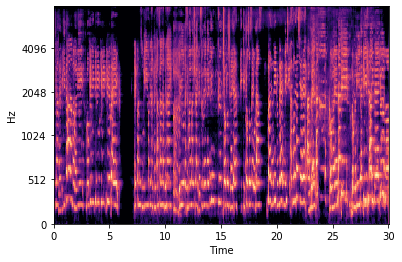

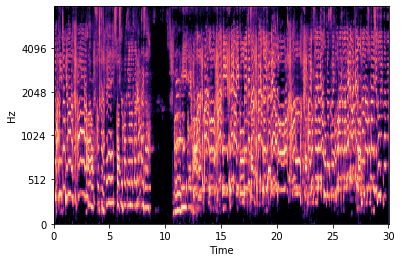

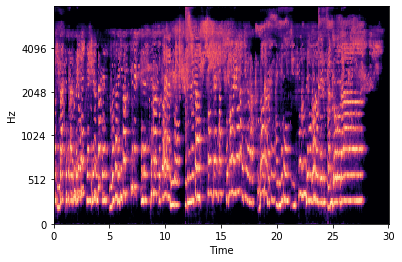

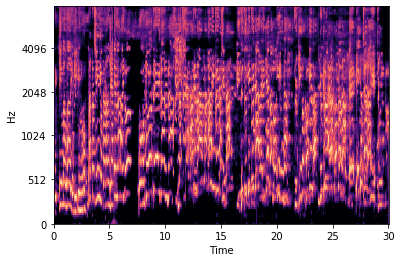

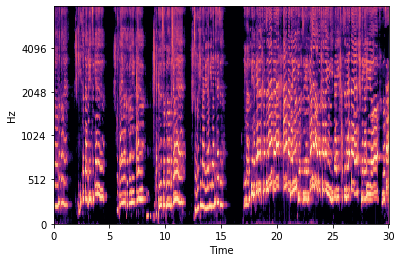

...

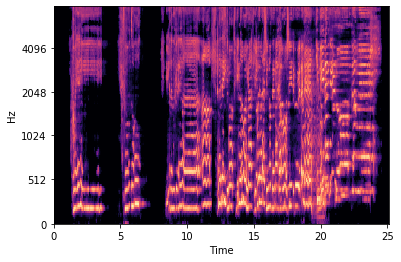

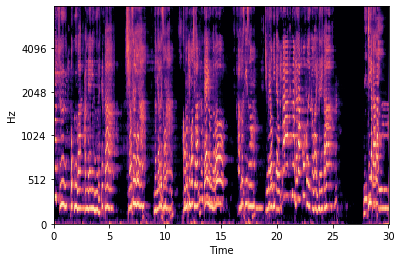

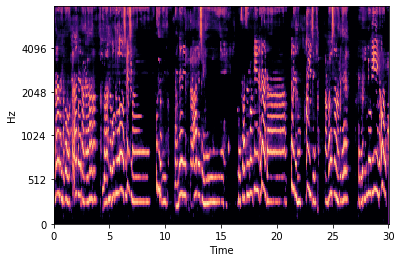

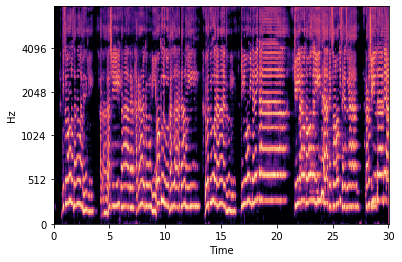

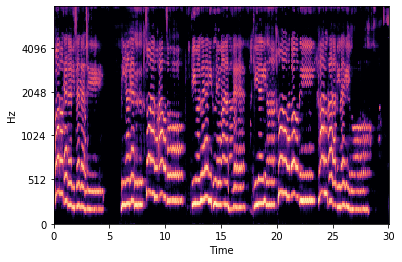

In [22]:
def CreateSpectrogram(filename,spectro):
    print("Spectrogram Reached")
    print(filename)
    
    y, sr = librosa.load(filename)
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
    fig, ax = plt.subplots()

    S_dB = librosa.power_to_db(S, ref=np.max)

    img = librosa.display.specshow(S_dB, x_axis='time',

                             y_axis='mel', sr=sr,

                             fmax=8000, ax=ax)

#     fig.colorbar(img, ax=ax, format='%+2.0f dB')

#     ax.set(title='Mel-frequency spectrogram')
    
    fig.savefig(spectro+'.png')
    print("Spectrogram Finished")
    
    




English = "English"
French = "French"
German = "German"
Japan = "Japanese"

EnglishFiles = glob.glob('/media/russell/ESD-USB/output/English/**/vocals.wav', recursive=True)
FrenchFiles = glob.glob('/media/russell/ESD-USB/output/French/**/vocals.wav', recursive=True)
GermanFiles = glob.glob('/media/russell/ESD-USB/output/German/**/vocals.wav', recursive=True)
JapanFiles = glob.glob('/media/russell/ESD-USB/output/Japan/**/vocals.wav', recursive=True)

# i=0
# for song in EnglishFiles:
#     CreateSpectrogram(song,English+str(i))
#     i+=1

# j=0
# for song in FrenchFiles:
#     CreateSpectrogram(song,French+str(j))
#     j+=1

    
# k=0
# for song in GermanFiles:
#     CreateSpectrogram(song,German+str(k))
#     k+=1
   
l=0
for song in JapanFiles:
    CreateSpectrogram(song,Japan+str(l))
    l+=1
    
    
    
    


In [36]:
batch_size = 128
pic_size = 48


datagen_train = ImageDataGenerator()
datagen_validation = ImageDataGenerator()

base_path = "/media/russell/ESD-USB/Spectrogram/"


train_generator = datagen_train.flow_from_directory(base_path + "Train",
                                                    target_size=(pic_size,pic_size),
                                                    color_mode="grayscale",
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    shuffle=True)

print("Train Generator")
print(train_generator)



validation_generator = datagen_validation.flow_from_directory(base_path + "validation",
                                                    target_size=(pic_size,pic_size),
                                                    color_mode="grayscale",
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    shuffle=False)

print("Validation Generator")
print(validation_generator)





Found 311 images belonging to 4 classes.
Train Generator
Found 36 images belonging to 4 classes.
Validation Generator


In [37]:
LanguageClasses = 4
model = Sequential()

# 1 - Convolution
model.add(Conv2D(64,(3,3), padding='same', input_shape=(48, 48,1)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

# 2nd Convolution layer
model.add(Conv2D(128,(5,5), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

# 3rd Convolution layer
model.add(Conv2D(512,(3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

# 4th Convolution layer
model.add(Conv2D(512,(3,3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

# Flattening
model.add(Flatten())

# Fully connected layer 1st layer
model.add(Dense(256))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.25))

# Fully connected layer 2nd layer
model.add(Dense(512))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.25))

model.add(Dense(LanguageClasses, activation='softmax'))

opt = Adam(lr=0.0001)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['acc'])

print("Model Created")


Model Created


In [40]:
#This is where the method gets trained


epochs = 50


metric = 'val_loss'
# checkpoint = ModelCheckpoint('best.h5', monitor=metric,
#                     verbose=2, save_best_only=True, mode='max')

checkpoint = ModelCheckpoint('best.h5', verbose=1, monitor='val_accuracy', save_best_only=True, mode='auto',save_freq='epoch')

callbacks_list = [checkpoint]


history = model.fit_generator(generator=train_generator,
                                steps_per_epoch=train_generator.n//train_generator.batch_size,
                                epochs=epochs,
                                validation_data = validation_generator,
                                validation_steps = validation_generator.n//validation_generator.batch_size,
                                callbacks=callbacks_list
                                )


model_json = model.to_json()
with open("LanguageModel.json","w") as json_file:
    json_file.write(model_json)

print("File Created")



Epoch 1/50
2/2 [==============================] - 2s 1s/step - loss: 1.5929 - acc: 0.2969
Epoch 2/50
2/2 [==============================] - 2s 1s/step - loss: 1.5405 - acc: 0.3281
Epoch 3/50
2/2 [==============================] - 2s 1s/step - loss: 1.5660 - acc: 0.3115
Epoch 4/50
2/2 [==============================] - 1s 493ms/step - loss: 1.4615 - acc: 0.3443
Epoch 5/50
2/2 [==============================] - 2s 1s/step - loss: 1.4416 - acc: 0.3711
Epoch 6/50
2/2 [==============================] - 1s 711ms/step - loss: 1.4879 - acc: 0.3443
Epoch 7/50
2/2 [==============================] - 3s 2s/step - loss: 1.3873 - acc: 0.3716
Epoch 8/50
2/2 [==============================] - 3s 2s/step - loss: 1.4564 - acc: 0.3443
Epoch 9/50
2/2 [==============================] - 3s 2s/step - loss: 1.4521 - acc: 0.3398
Epoch 10/50
2/2 [==============================] - 3s 2s/step - loss: 1.3854 - acc: 0.3867
Epoch 11/50
2/2 [==============================] - 3s 2s/step - loss: 1.4854 - acc: 0.3828
Ep

Epoch 34/50
2/2 [==============================] - 3s 2s/step - loss: 1.3983 - acc: 0.3770
Epoch 35/50
2/2 [==============================] - 3s 2s/step - loss: 1.5379 - acc: 0.3497
Epoch 36/50
2/2 [==============================] - 1s 689ms/step - loss: 1.4351 - acc: 0.3716
Epoch 37/50
2/2 [==============================] - 1s 683ms/step - loss: 1.3224 - acc: 0.4044
Epoch 38/50
2/2 [==============================] - 1s 682ms/step - loss: 1.5101 - acc: 0.3279
Epoch 39/50
2/2 [==============================] - 3s 1s/step - loss: 1.3149 - acc: 0.4336
Epoch 40/50
2/2 [==============================] - 3s 2s/step - loss: 1.4421 - acc: 0.3750
Epoch 41/50
2/2 [==============================] - 3s 2s/step - loss: 1.3537 - acc: 0.3934
Epoch 42/50
2/2 [==============================] - 3s 1s/step - loss: 1.3913 - acc: 0.3945
Epoch 43/50
2/2 [==============================] - 1s 691ms/step - loss: 1.4018 - acc: 0.3934
Epoch 44/50
2/2 [==============================] - 1s 689ms/step - loss: 1.332

In [34]:
# acc = history.history['accuracy']
# val_acc = history.history['val_accuracy']
# loss=history.history['loss']
# val_loss=history.history['val_loss']
# epochs_range = range(epochs)
# plt.figure(figsize=(8, 8))
# plt.subplot(1, 2, 1)
# plt.plot(epochs_range, acc, label='Training Accuracy')
# plt.plot(epochs_range, val_acc, label='Validation Accuracy')
# plt.legend(loc='lower right')
# plt.title('Training and Validation Accuracy')
# plt.subplot(1, 2, 2)
# plt.plot(epochs_range, loss, label='Training Loss')
# plt.plot(epochs_range, val_loss, label='Validation Loss')
# plt.legend(loc='upper right')
# plt.title('Training and Validation Loss')
# plt.show()

<Figure size 432x288 with 0 Axes>

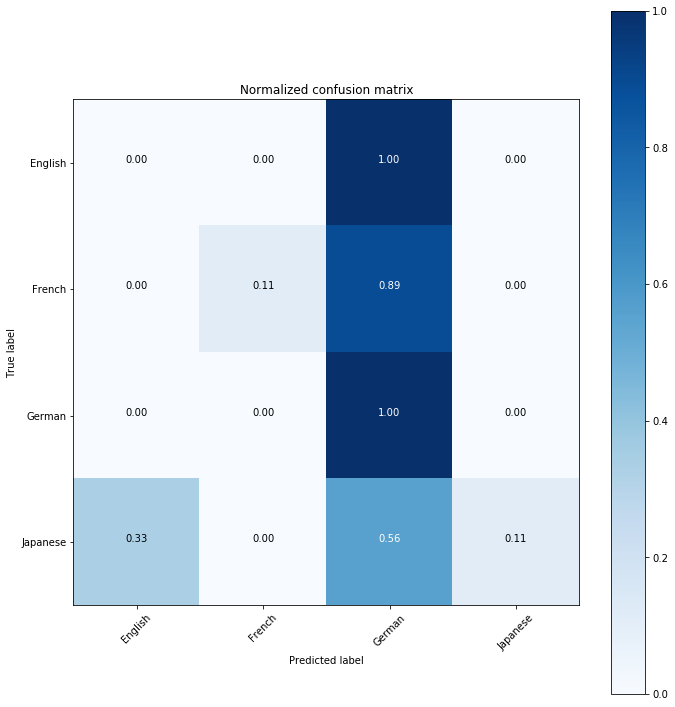

Y Prediction
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 3, 0, 2]
Y Test
[0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3]
Class Names
dict_keys(['English', 'French', 'German', 'Japanese'])


In [41]:
#Plotting Confusion Matrix

predictions = model.predict_generator(generator=validation_generator)
y_pred = [np.argmax(probas) for probas in predictions]
y_test = validation_generator.classes
class_names = validation_generator.class_indices.keys()

def plot_confusion_matrix(cm, classes, title='Confusion matrix', cmap=plt.cm.Blues):
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    
# compute confusion matrix
cnf_matrix = confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)

# plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, title='Normalized confusion matrix')
plt.show()
    
print("Y Prediction")
print(y_pred)

print("Y Test")
print(y_test)

print("Class Names")
print(class_names)




